<img align="left" src="https://lever-client-logos.s3.amazonaws.com/864372b1-534c-480e-acd5-9711f850815c-1524247202159.png" width=200>
<br></br>
<br></br>

# Topic Modeling
## *Data Science Unit 4 Sprint 1 Assignment 4*

Analyze a corpus of Amazon reviews from Unit 4 Sprint 1 Module 1's lecture using topic modeling: 

- Fit a Gensim LDA topic model on Amazon Reviews
- Select appropriate number of topics
- Create some dope visualization of the topics
- Write a few bullets on your findings in markdown at the end
- **Note**: You don't *have* to use generators for this assignment

In [213]:
"""Import Statements"""

import numpy as np
import gensim
import os
import re

from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS
from gensim import corpora

from gensim.models.ldamulticore import LdaMulticore

import pandas as pd

import spacy
nlp = spacy.load("en_core_web_lg")

def tokenize(text):
    """Parses a string into a list of semantic units (words)

    Args:
        text (str): The string that the function will tokenize.

    Returns:
        list: tokens parsed out by the mechanics of your choice
    """
    
    tokens = re.sub(r'[^a-zA-Z ^0-9]', '', text)
    tokens = tokens.lower().split()

In [214]:
%pwd

'/Users/jorge/Unit 4 DS 10/DS-Unit-4-Sprint-1-NLP/module4-topic-modeling'

In [218]:
path = './data/amazon'

In [219]:
import pandas as pd

df =pd.read_csv ('./data/amazon/Datafiniti_Amazon_Consumer_Reviews_of_Amazon_Products_May19.csv')
df.shape

(28332, 24)

In [220]:
 df.head(3)

,id,dateAdded,dateUpdated,name,asins,brand,categories,primaryCategories,imageURLs,keys,...,reviews.didPurchase,reviews.doRecommend,reviews.id,reviews.numHelpful,reviews.rating,reviews.sourceURLs,reviews.text,reviews.title,reviews.username,sourceURLs
0,AVpgNzjwLJeJML43Kpxn,2015-10-30T08:59:32Z,2019-04-25T09:08:16Z,AmazonBasics AAA Performance Alkaline Batterie...,"B00QWO9P0O,B00LH3DMUO",Amazonbasics,"AA,AAA,Health,Electronics,Health & Household,C...",Health & Beauty,https://images-na.ssl-images-amazon.com/images...,"amazonbasics/hl002619,amazonbasicsaaaperforman...",...,NaN,NaN,NaN,NaN,3,https://www.amazon.com/product-reviews/B00QWO9...,I order 3 of them and one of the item is bad q...,... 3 of them and one of the item is bad quali...,Byger yang,"https://www.barcodable.com/upc/841710106442,ht..."
1,AVpgNzjwLJeJML43Kpxn,2015-10-30T08:59:32Z,2019-04-25T09:08:16Z,AmazonBasics AAA Performance Alkaline Batterie...,"B00QWO9P0O,B00LH3DMUO",Amazonbasics,"AA,AAA,Health,Electronics,Health & Household,C...",Health & Beauty,https://images-na.ssl-images-amazon.com/images...,"amazonbasics/hl002619,amazonbasicsaaaperforman...",...,NaN,NaN,NaN,NaN,4,https://www.amazon.com/product-reviews/B00QWO9...,Bulk is always the less expensive way to go fo...,... always the less expensive way to go for pr...,ByMG,"https://www.barcodable.com/upc/841710106442,ht..."
2,AVpgNzjwLJeJML43Kpxn,2015-10-30T08:59:32Z,2019-04-25T09:08:16Z,AmazonBasics AAA Performance Alkaline Batterie...,"B00QWO9P0O,B00LH3DMUO",Amazonbasics,"AA,AAA,Health,Electronics,Health & Household,C...",Health & Beauty,https://images-na.ssl-images-amazon.com/images...,"amazonbasics/hl002619,amazonbasicsaaaperforman...",...,NaN,NaN,NaN,NaN,5,https://www.amazon.com/product-reviews/B00QWO9...,Well they are not Duracell but for the price i...,... are not Duracell but for the price i am ha...,BySharon Lambert,"https://www.barcodable.com/upc/841710106442,ht..."


In [221]:
df.rename(columns ={'reviews.text':'reviews'}, inplace = True)

In [222]:
df.tail(3)

,id,dateAdded,dateUpdated,name,asins,brand,categories,primaryCategories,imageURLs,keys,...,reviews.didPurchase,reviews.doRecommend,reviews.id,reviews.numHelpful,reviews.rating,reviews.sourceURLs,reviews,reviews.title,reviews.username,sourceURLs
28329,AVqkIhxunnc1JgDc3kg_,2017-03-06T14:59:43Z,2019-02-23T02:49:38Z,"Fire HD 8 Tablet with Alexa, 8 HD Display, 16 ...",B018T075DC,Amazon,"Fire Tablets,Tablets,All Tablets,Amazon Tablet...",Electronics,https://www.upccodesearch.com/images/barcode/0...,"amazon/b018t075dc,firehd8tabletwithalexa8hddis...",...,NaN,True,NaN,0.0,5,http://reviews.bestbuy.com/3545/5620410/review...,"Very nice for light internet browsing, keeping...",You get a lot for the price!,suzannalicious,http://reviews.bestbuy.com/3545/5620410/review...
28330,AVqkIhxunnc1JgDc3kg_,2017-03-06T14:59:43Z,2019-02-23T02:49:38Z,"Fire HD 8 Tablet with Alexa, 8 HD Display, 16 ...",B018T075DC,Amazon,"Fire Tablets,Tablets,All Tablets,Amazon Tablet...",Electronics,https://www.upccodesearch.com/images/barcode/0...,"amazon/b018t075dc,firehd8tabletwithalexa8hddis...",...,NaN,True,NaN,0.0,5,http://reviews.bestbuy.com/3545/5620410/review...,This Tablet does absolutely everything I want!...,You get the entire World for less than $100!,SandyJ,http://reviews.bestbuy.com/3545/5620410/review...
28331,AVqkIhxunnc1JgDc3kg_,2017-03-06T14:59:43Z,2019-02-23T02:49:38Z,"Fire HD 8 Tablet with Alexa, 8 HD Display, 16 ...",B018T075DC,Amazon,"Fire Tablets,Tablets,All Tablets,Amazon Tablet...",Electronics,https://www.upccodesearch.com/images/barcode/0...,"amazon/b018t075dc,firehd8tabletwithalexa8hddis...",...,NaN,True,NaN,0.0,4,http://reviews.bestbuy.com/3545/5620410/review...,"At ninety dollars, the expectionations are low...",You get what your paying for,Hung,http://reviews.bestbuy.com/3545/5620410/review...


In [223]:
df.describe(exclude='number')

,id,dateAdded,dateUpdated,name,asins,brand,categories,primaryCategories,imageURLs,keys,...,manufacturerNumber,reviews.date,reviews.dateSeen,reviews.didPurchase,reviews.doRecommend,reviews.sourceURLs,reviews,reviews.title,reviews.username,sourceURLs
count,28332,28332,28332,28332,28332,28332,28332,28332,28332,28332,...,28332,28332,28332,9,16086,28332,28332,28332,28332,28332
unique,65,55,52,65,65,3,60,9,65,65,...,65,1313,606,2,2,9906,18168,10441,16269,65
top,AVpgNzjwLJeJML43Kpxn,2015-10-30T08:59:32Z,2019-04-25T09:08:16Z,AmazonBasics AAA Performance Alkaline Batterie...,"B00QWO9P0O,B00LH3DMUO",Amazon,"AA,AAA,Health,Electronics,Health & Household,C...",Electronics,https://images-na.ssl-images-amazon.com/images...,"amazonbasics/hl002619,amazonbasicsaaaperforman...",...,HL-002619,2017-01-23T00:00:00.000Z,2017-08-28T00:00:00Z,True,True,https://www.amazon.com/product-reviews/B00QWO9...,good,Five Stars,ByAmazon Customer,"https://www.barcodable.com/upc/841710106442,ht..."
freq,8343,8343,8343,8343,8343,16153,8343,13995,8343,8343,...,8343,532,8343,8,15353,12071,60,3937,889,8343


In [224]:
df.dtypes

id                      object
dateAdded               object
dateUpdated             object
name                    object
asins                   object
brand                   object
categories              object
primaryCategories       object
imageURLs               object
keys                    object
manufacturer            object
manufacturerNumber      object
reviews.date            object
reviews.dateSeen        object
reviews.didPurchase     object
reviews.doRecommend     object
reviews.id             float64
reviews.numHelpful     float64
reviews.rating           int64
reviews.sourceURLs      object
reviews                 object
reviews.title           object
reviews.username        object
sourceURLs              object
dtype: object

In [226]:
df['reviews'][:10]

0    I order 3 of them and one of the item is bad q...
1    Bulk is always the less expensive way to go fo...
2    Well they are not Duracell but for the price i...
3    Seem to work as well as name brand batteries a...
4    These batteries are very long lasting the pric...
5    Bought a lot of batteries for Christmas and th...
6    ive not had any problame with these batteries ...
7    Well if you are looking for cheap non-recharge...
8    These do not hold the amount of high power jui...
9    AmazonBasics AA AAA batteries have done well b...
Name: reviews, dtype: object

In [242]:
nlp = spacy.load('en_core_web_lg')

In [243]:
#Tokenizer Pipe

tokens = []

# Make the tokens
for doc in nlp.pipe(df['reviews'], disable=['tagger', 'parser', 'ner']):
    
    doc_tokens = []
    
    for token in doc:
        if (token.is_stop==False) & (token.is_punct==False):
           doc_tokens.append(token.text)
   
    tokens.append(doc_tokens)
    
df['tokens'] = tokens

### Text Preprocessing

In [244]:
# 1) Plain Python - ''.split command
# 2) Spacy - just the lemmas from the document
# 3) Gensim - simple_preprocess

def tokenize(text):
    "Complete this function"
    
    return [token for token in simple_preprocess(text) if token in STOPWORDS]

In [245]:
import os

def gather_data(path_to_data): 
    data = []
    for f in os.listdir(path):
        if os.path.isdir(f) == False:
            if f[-3:] == 'txt':
                with open(os.path.join(path,f)) as t:
                    text = t.read().strip('\n')
                    data.append(tokenize(str(text)))       
    return data

In [246]:
#tokens = gather_data(path)

In [247]:
tokens[0][0:10]

['order',
 '3',
 'item',
 'bad',
 'quality',
 'missing',
 'backup',
 'spring',
 'pcs',
 'aluminum']

In [268]:
"this is a sample string with a \n newline character".replace('\n', '')

'this is a sample string with a  newline character'

In [269]:
df['tokens'].head()

([order, 3, item, bad, quality, missing, backup, spring, pcs, aluminum, battery, work],)    [order, 3, item, bad, quality, missing, backup...
([Bulk, expensive, way, products, like],)                                                              [Bulk, expensive, way, products, like]
([Duracell, price, happy],)                                                                                          [Duracell, price, happy]
([work, brand, batteries, better, price],)                                                            [work, brand, batteries, better, price]
([batteries, long, lasting, price, great],)                                                          [batteries, long, lasting, price, great]
Name: tokens, dtype: object

## Follow Along

In [270]:
reviews = [t[:-4] for t in os.listdir(path) if os.path.isdir(t) == False]

In [271]:
len(reviews)

1

In [272]:
STOPWORDS = set(STOPWORDS).union(set(['said', 'mr', 'mrs']))

def tokenize(text):
    return [token for token in simple_preprocess(text) if token not in STOPWORDS]

In [273]:
tokenize("Hello World! This a test of the tokenization method")

['hello', 'world', 'test', 'tokenization', 'method']

In [274]:
len(tokens)

28332

### Amazon DataFrame

In [277]:
df = pd.DataFrame(index=df, data={'tokens':tokens})

In [278]:
df.head()

,tokens
"([order, 3, item, bad, quality, missing, backup, spring, pcs, aluminum, battery, work],)","[order, 3, item, bad, quality, missing, backup..."
"([Bulk, expensive, way, products, like],)","[Bulk, expensive, way, products, like]"
"([Duracell, price, happy],)","[Duracell, price, happy]"
"([work, brand, batteries, better, price],)","[work, brand, batteries, better, price]"
"([batteries, long, lasting, price, great],)","[batteries, long, lasting, price, great]"


### Streaming Documents

In [279]:
def doc_stream(path):
    for f in os.listdir(path):
        if os.path.isdir(f) == False:
            if f[-3:] == 'txt':
                with open(os.path.join(path,f)) as t:
                    text = t.read().strip('\n')
                    tokens = tokenize(str(text))
                yield tokens

In [280]:
streaming_data = doc_stream(path)

In [281]:
type(streaming_data)

generator

### Gensim LDA Topic Modeling

In [287]:
# A Dictionary Representation of all the words in our corpus
id2word = corpora.Dictionary(df['tokens'])

In [289]:
id2word.filter_extremes(no_below=5, no_above=0.95)

In [290]:
len(id2word.keys())

4280

In [292]:
# a bag of words(bow) representation of our corpus
# Note: we haven't actually read any text into memory here
# Although abstracted away - tokenization IS happening in the doc_stream f(x)
corpus = [id2word.doc2bow(text) for text in df['tokens']]

In [293]:
corpus[345][:10]

[(17, 1), (18, 1), (21, 1), (34, 1)]

In [295]:
lda = LdaMulticore(corpus=corpus,
                   id2word=id2word,
                   random_state=723812,
                   num_topics = 10,
                   passes=10,
                   workers=8
                  )

/Users/jorge/.local/share/virtualenvs/DS-Unit-4-Sprint-1-NLP-ekY37MLJ/lib/python3.7/site-packages/gensim/models/ldamodel.py:826: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/Users/jorge/.local/share/virtualenvs/DS-Unit-4-Sprint-1-NLP-ekY37MLJ/lib/python3.7/site-packages/gensim/models/ldamodel.py:826: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/Users/jorge/.local/share/virtualenvs/DS-Unit-4-Sprint-1-NLP-ekY37MLJ/lib/python3.7/site-packages/gensim/models/ldamodel.py:826: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the futur

In [296]:
lda.print_topics()

[(0,
  '0.033*"tablet" + 0.032*"Fire" + 0.022*"Kindle" + 0.022*"great" + 0.018*"use" + 0.017*"Amazon" + 0.015*"easy" + 0.013*"8" + 0.012*"HD" + 0.011*"better"'),
 (1,
  '0.055*"great" + 0.030*"work" + 0.023*"good" + 0.023*"tablet" + 0.023*"kids" + 0.014*"price" + 0.012*"like" + 0.011*"fine" + 0.010*"works" + 0.008*"purchase"'),
 (2,
  '0.101*"batteries" + 0.031*"long" + 0.023*"price" + 0.022*"brand" + 0.019*"great" + 0.019*"good" + 0.018*"buy" + 0.015*"Amazon" + 0.015*"brands" + 0.014*"work"'),
 (3,
  '0.040*"tablet" + 0.040*"loves" + 0.034*"old" + 0.032*"year" + 0.021*"kids" + 0.020*"games" + 0.018*"bought" + 0.017*"use" + 0.014*"son" + 0.014*"daughter"'),
 (4,
  '0.021*"Amazon" + 0.016*"tablet" + 0.013*"apps" + 0.011*"store" + 0.010*"product" + 0.010*"kids" + 0.009*"play" + 0.009*"expected" + 0.007*"like" + 0.007*"read"'),
 (5,
  '0.027*"reading" + 0.024*"books" + 0.021*"read" + 0.018*"Kindle" + 0.016*"great" + 0.013*"screen" + 0.012*"light" + 0.012*"reader" + 0.011*"kindle" + 0.011*

In [297]:
words = [re.findall(r'"([^"]*)"',t[1]) for t in lda.print_topics()]

In [298]:
topics = [' '.join(t[0:5]) for t in words]

In [299]:
for id, t in enumerate(topics): 
    print(f"------ Topic {id} ------")
    print(t, end="\n\n")

------ Topic 0 ------
tablet Fire Kindle great use

------ Topic 1 ------
great work good tablet kids

------ Topic 2 ------
batteries long price brand great

------ Topic 3 ------
tablet loves old year kids

------ Topic 4 ------
Amazon tablet apps store product

------ Topic 5 ------
reading books read Kindle great

------ Topic 6 ------
price good Great product tablet

------ Topic 7 ------
tablet use love great easy

------ Topic 8 ------
batteries Good price value Great

------ Topic 9 ------
use tablet great Amazon like



# Interpret LDA Results (Learn)


In [300]:
import pyLDAvis.gensim

pyLDAvis.enable_notebook()

In [302]:
# *** ON SPRINT CHALLENGE THIS MAY TAKE A LONG TIME TO RUN!***
pyLDAvis.gensim.prepare(lda, corpus, id2word)

/Users/jorge/.local/share/virtualenvs/DS-Unit-4-Sprint-1-NLP-ekY37MLJ/lib/python3.7/site-packages/pyLDAvis/_prepare.py:257: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  return pd.concat([default_term_info] + list(topic_dfs))


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
2      0.223740 -0.045921       1        1  16.869814
3     -0.171124 -0.182308       2        1  15.170580
0     -0.084841  0.077565       3        1  10.502616
5     -0.083685  0.111350       4        1  10.168687
7     -0.125373 -0.028889       5        1   9.237894
8      0.219254 -0.029310       6        1   9.059346
4     -0.028356  0.025421       7        1   8.071697
9     -0.083077  0.071600       8        1   8.053596
6      0.123892  0.038881       9        1   7.061316
1      0.009571 -0.038390      10        1   5.804455, topic_info=     Category         Freq       Term        Total  loglift  logprob
18    Default  7184.000000  batteries  7184.000000  30.0000  30.0000
17    Default  4897.000000      price  4897.000000  29.0000  29.0000
34    Default  4355.000000       good  4355.000000  28.0000  28.0000
2140  Default  2113.000000      loves  2113.000000  27.0000  27.0000
2820  Default  6571.000000     tablet  6571.000000  26.0000  26.0000
106   Default  1683.000000       year  1683.000000  25.0000  25.0000
490   Default  1313.000000       Good  1313.000000  24.0000  24.0000
9     Default  1953.000000       work  1953.000000  23.0000  23.0000
555   Default  2083.000000        old  2083.000000  22.0000  22.0000
21    Default  5778.000000      great  5778.000000  21.0000  21.0000
1722  Default  1406.000000       Fire  1406.000000  20.0000  20.0000
111   Default  3215.000000      Great  3215.000000  19.0000  19.0000
194   Default  2319.000000       kids  2319.000000  18.0000  18.0000
20    Default  1292.000000      brand  1292.000000  17.0000  17.0000
1042  Default  1181.000000    reading  1181.000000  16.0000  16.0000
3227  Default  1707.000000     Kindle  1707.000000  15.0000  15.0000
92    Default  2564.000000       love  2564.000000  14.0000  14.0000
417   Default  1049.000000      value  1049.000000  13.0000  13.0000
23    Default  2354.000000       long  2354.000000  12.0000  12.0000
2428  Default  1500.000000      books  1500.000000  11.0000  11.0000
184   Default  4301.000000        use  4301.000000  10.0000  10.0000
852   Default  1186.000000       read  1186.000000   9.0000   9.0000
819   Default  2140.000000       easy  2140.000000   8.0000   8.0000
167   Default  1915.000000    product  1915.000000   7.0000   7.0000
76    Default   878.000000     brands   878.000000   6.0000   6.0000
706   Default  1720.000000      games  1720.000000   5.0000   5.0000
24    Default  3194.000000     Amazon  3194.000000   4.0000   4.0000
1425  Default   918.000000   daughter   918.000000   3.0000   3.0000
2415  Default  1192.000000     kindle  1192.000000   2.0000   2.0000
963   Default   981.000000       gift   981.000000   1.0000   1.0000
...       ...          ...        ...          ...      ...      ...
668   Topic10    88.712418  excellent   360.479065   1.4445  -5.3225
3000  Topic10    17.319036     nieces    28.235550   2.3578  -6.9561
34    Topic10   422.065369       good  4355.673828   0.5125  -3.7628
2560  Topic10    20.515316   backpack    36.854542   2.2607  -6.7867
39    Topic10   151.306641   purchase   930.780090   1.0298  -4.7886
462   Topic10   136.917358       deal   824.959595   1.0506  -4.8885
509   Topic10    91.382462      small   451.226196   1.2496  -5.2929
2820  Topic10   417.406464     tablet  6571.752441   0.0901  -3.7739
12    Topic10   218.122330       like  2359.258301   0.4655  -4.4229
681   Topic10    34.373184      solid    89.014763   1.8950  -6.2706
3214  Topic10   109.322891    tablets   721.156250   0.9600  -5.1136
77    Topic10    54.783768       feel   209.515671   1.5051  -5.8045
321   Topic10   111.620865       case   786.097839   0.8946  -5.0928
102   Topic10   111.101303        got   910.363342   0.7431  -5.0975
17    Topic10   248.943100      price  4897.600586  -0.1327  -4.2907
133   Topic10   115.856873  purchased  1054.239502   0.6383  -5.05

### Overall Model / Documents

In [303]:
lda[corpus[0]]

[(6, 0.38632038), (8, 0.54093874)]

In [305]:
distro = [lda[d] for d in corpus]

In [306]:
distro[0]

[(6, 0.38641438), (8, 0.5408447)]

In [307]:
distro = [lda[d] for d in corpus]

def update(doc):
    d_dist = {k:0 for k in range(0,15)}
    for t in doc:
        d_dist[t[0]]= t[1]
    return d_dist

new_distro = [update(d) for d in distro]

In [308]:
len(new_distro)

28332

### Selecting the Number of Topics

In [313]:
from gensim.models.coherencemodel import CoherenceModel

def compute_coherence_values(dictionary, corpus, limit, start=2, step=3, passes=5):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    limit : Max num of topics
    passes: the number of times the entire lda model & coherence values are calculated

    Returns:
    -------
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    
    coherence_values = []
    
    for iter_ in range(passes):
        for num_topics in range(start, limit, step):
            model = LdaMulticore(corpus=corpus, num_topics=num_topics, id2word=dictionary, workers=4)
            coherencemodel = CoherenceModel(model=model,dictionary=dictionary,corpus=corpus, coherence='u_mass')
            coherence_values.append({'pass': iter_, 
                                     'num_topics': num_topics, 
                                     'coherence_score': coherencemodel.get_coherence()
                                    })

    return coherence_values

In [314]:
# Can take a long time to run.
coherence_values = compute_coherence_values(dictionary=id2word, 
                                                        corpus=corpus,
                                                        start=2, 
                                                        limit=10, 
                                                        step=6,
                                                        passes=40)

/Users/jorge/.local/share/virtualenvs/DS-Unit-4-Sprint-1-NLP-ekY37MLJ/lib/python3.7/site-packages/gensim/models/ldamodel.py:826: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/Users/jorge/.local/share/virtualenvs/DS-Unit-4-Sprint-1-NLP-ekY37MLJ/lib/python3.7/site-packages/gensim/models/ldamodel.py:826: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/Users/jorge/.local/share/virtualenvs/DS-Unit-4-Sprint-1-NLP-ekY37MLJ/lib/python3.7/site-packages/gensim/models/ldamodel.py:826: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the futur

/Users/jorge/.local/share/virtualenvs/DS-Unit-4-Sprint-1-NLP-ekY37MLJ/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


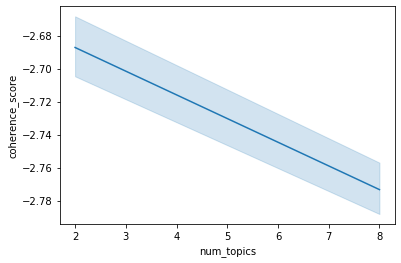

In [318]:
import seaborn as sns

ax = sns.lineplot(x="num_topics", y="coherence_score", data=topic_coherence)

In [319]:
topic_coherence = pd.DataFrame.from_records(coherence_values)

In [320]:
topic_coherence.head()

,coherence_score,num_topics,pass
0,-2.643691,2,0
1,-2.737541,8,0
2,-2.634956,2,1
3,-2.753941,8,1
4,-2.756095,2,2


In [324]:
# Print the coherence scores
for m, cv in zip(x,coherence_values):
    print("Num Topics =", m, " has Coherence Value of", round(cv, 4))

NameError: name 'x' is not defined

## Stretch Goals

* Incorporate Named Entity Recognition in your analysis
* Incorporate some custom pre-processing from our previous lessons (like spacy lemmatization)
* Analyze a dataset of interest to you with topic modeling